In [1]:
## BEAMMAP Class codebase: going from the time domain to the position/map domain
from IPython.display import display, HTML
display(HTML("<style>.container { width:99% !important; }</style>"))

from matplotlib.pyplot import *
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MultipleLocator
import numpy as np
import h5py
import hdf5plugin
import os
import glob
from matplotlib import colors
import pandas
import csv
import datetime
import pytz
import bisect
import pygeodesy
import yaml
from scipy.signal import square
from scipy.stats import pearsonr
import glob
import pickle

## Import packages from our own module:
from beamcals import corr
from beamcals import drone
from beamcals import bicolog
from beamcals import concat
from beamcals import beammap
import beamcals.plotting_utils as pu
import beamcals.fitting_utils as fu
import beamcals.geometry_utils as gu
import beamcals.time_utils as tu
from beamcals.sites import site

d3asite=site.site('../beamcals/beamcals/sites/D3A_3m_config.npz')
gbosite=site.site('../beamcals/beamcals/sites/GBO_config.npz')

from scipy.stats import binned_statistic_2d

In [2]:
## Class for position-space sorting/averaging of beammap flight data, from time domain data:
#defines coordinate vector from xmax to xmin spaced roughly by xres:
def cedges(args):
    cmin,cmax,cres=args
    return np.linspace(cmin,cmax,int((cmax-cmin)/cres)+1)

class Beammap:
    def __init__(self,concatlist=[],gfitlist=[],Xargs=[-100,100,5],Yargs=[-100,100,5],\
                 Fargs=[0,1024,1],f_index=900,\
                 operation='coadd',inputstyle='pickle',normalization='none',vplot=True,\
                 pickle_directory='/hirax/GBO_Analysis_Outputs/flight_pickles/',\
                 gfit_directory='/hirax/GBO_Analysis_Outputs/main_beam_fits/',\
                 flightmasterpath='../analysis/GBO_flights_forscripts.yaml'):
        ## enable format of input to be load from 'pickle' filestring or bin/map using concat 'class':        
        self.concat_list=concatlist
        self.gfit_list=gfitlist
        nchanslist=np.zeros(len(concatlist))
        if inputstyle=='pickle':
            for h,cstring in enumerate(concatlist):
                ## using the with loop structure, the pickle file is closed after ccc is loaded:
                with open(pickle_directory+cstring, "rb") as f:
                    CONCATCLASS=pickle.load(f)
                nchanslist[h]=CONCATCLASS.n_channels
                self.FLYNUM=cstring.split('FLY')[1].split('_')[0]
        elif inputstyle=='class':
            CONCATCLASS=concatlist[0]
            for h,cstring in enumerate(concatlist):
                nchanslist[h]=cstring.n_channels
                self.FLYNUM=cstring.FLYTAG.split('FLY')[1].split('.')[0]
        
        ## determine which channel is co-pol, for frequency dependent centroid corrections:
        with open(flightmasterpath, 'r') as flightmaster:
            doccs = yaml.safe_load(flightmaster)
            for j,fstr in enumerate(doccs['flight_info']['flights']):
                if self.FLYNUM in fstr:
                    self.copoldir=doccs['flight_info']['pols'][j]

        #get variables that should be kept along from the first concat class:         
        self.name=CONCATCLASS.name
        self.Data_Directory=CONCATCLASS.Data_Directory
        self.Gain_Directory=CONCATCLASS.Gain_Directory
        self.filenames=CONCATCLASS.filenames
        self.gainfile=CONCATCLASS.gainfile
        self.Drone_Directory=CONCATCLASS.Drone_Directory
        self.FLYTAG=CONCATCLASS.FLYTAG
        self.n_dishes=CONCATCLASS.n_dishes
        self.n_channels=int(np.nanmin(nchanslist))
        self.n_concats=len(concatlist)
        self.chmap=CONCATCLASS.chmap
        self.automap=CONCATCLASS.automap
        self.crossmap=CONCATCLASS.crossmap
        self.origin=CONCATCLASS.origin
        #self.prime_origin=CONCATCLASS.prime_origin ## omit, it breaks the pickle
        self.dish_keystrings=CONCATCLASS.dish_keystrings
        self.dish_coords=CONCATCLASS.dish_coords
        self.dish_pointings=CONCATCLASS.dish_pointings
        self.dish_polarizations=CONCATCLASS.dish_polarizations
        fmin,fmax,fstep=Fargs
        self.faxis=np.arange(fmin,fmax,fstep)
        self.freq=CONCATCLASS.freq[self.faxis]
        find=np.where(self.faxis==f_index)[0][0]
        
        #create x,y cartesian vectors (edges and centers) and grids for the beammap:
        self.operation=operation
        xedges,yedges=(cedges(Xargs),cedges(Yargs))
        xedgesgrid,yedgesgrid=np.meshgrid(xedges,yedges)
        xcenters,ycenters=(cedges(Xargs)[:-1]+Xargs[2]/2.0,cedges(Yargs)[:-1]+Yargs[2]/2.0)
        xcentersgrid,ycentersgrid=np.meshgrid(xcenters,ycenters)
        
        #need to extend this to dimensionality of channels in concatclass.V
        self.x_edges=np.zeros(xedges.shape+(self.n_channels,))
        self.y_edges=np.zeros(yedges.shape+(self.n_channels,))
        self.x_edges_grid=np.zeros((xedgesgrid.shape+(self.n_channels,)))
        self.y_edges_grid=np.zeros((yedgesgrid.shape+(self.n_channels,)))
        self.x_centers=np.zeros(xcenters.shape+(self.n_channels,))
        self.y_centers=np.zeros(ycenters.shape+(self.n_channels,))
        self.x_centers_grid=np.zeros((xcentersgrid.shape+(self.n_channels,)))
        self.y_centers_grid=np.zeros((ycentersgrid.shape+(self.n_channels,)))
        for i in range(self.n_channels):
            if 'D3A' in CONCATCLASS.name:
                xoff=CONCATCLASS.dish_coords[i][0]
                yoff=CONCATCLASS.dish_coords[i][1]
            elif 'GBO' in CONCATCLASS.name:
                xoff=CONCATCLASS.dish_coords[i][0]
                yoff=CONCATCLASS.dish_coords[i][1]
            self.x_edges[:,i]=xedges
            self.x_centers[:,i]=xcenters
            self.y_edges[:,i]=yedges
            self.y_centers[:,i]=ycenters
            self.x_centers_grid[:,:,i]=xcentersgrid
            self.y_centers_grid[:,:,i]=ycentersgrid
            self.x_edges_grid[:,:,i]=xedgesgrid
            self.y_edges_grid[:,:,i]=yedgesgrid
            
        ## now need frequency dependent offset terms in shape (freq, channel, concat) to mimic V
        self.x_offsets=np.NAN*np.ones((len(self.freq),self.n_channels,self.n_concats))
        self.y_offsets=np.NAN*np.ones((len(self.freq),self.n_channels,self.n_concats))
        
        ## create arrays for V mean, V std, and histo: shape is (gridx, gridy, freq, chans, concatlist)
        self.V_LC_mean=np.NAN*np.ones((len(self.x_centers[:,0]),len(self.y_centers[:,0]),len(self.freq),self.n_channels,self.n_concats))
        self.V_LC_std=np.NAN*np.ones((len(self.x_centers[:,0]),len(self.y_centers[:,0]),len(self.freq),self.n_channels,self.n_concats))
        self.histogram_LC=np.NAN*np.ones((len(self.x_centers[:,0]),len(self.y_centers[:,0]),len(self.freq),self.n_channels,self.n_concats))
        
        ## loop through the concat classes (h,ccc=concatclass) and extract hist/V parameters:
        if vplot==True:
            fig0,axes0=subplots(nrows=2,ncols=4,figsize=(40,20))
            
        print("start of big ass loop is: {}".format(datetime.datetime.now()))

        for h,cstring in enumerate(concatlist):
            ## create automatic verification plot axes:
            if vplot==True:
                fig,axes=subplots(nrows=2,ncols=4,figsize=(40,20))
            ## using the with loop structure, the pickle file is closed after ccc is loaded:
            if inputstyle=='pickle':
                with open(pickle_directory+cstring, "rb") as f:
                    ccc=pickle.load(f)   
            elif inputstyle=='class':
                ccc=cstring
            t_cut=ccc.inds_on
            if normalization=='none':          
                if vplot==True:
                    im1x=axes[0][0].scatter(ccc.drone_xyz_per_dish_interp[0,t_cut,0],ccc.drone_xyz_per_dish_interp[0,t_cut,1],c=ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                    im1y=axes[1][0].scatter(ccc.drone_xyz_per_dish_interp[1,t_cut,0],ccc.drone_xyz_per_dish_interp[1,t_cut,1],c=ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())    
                    im1x0=axes0[0][0].scatter(ccc.drone_xyz_per_dish_interp[0,t_cut,0],ccc.drone_xyz_per_dish_interp[0,t_cut,1],c=ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                    im1y0=axes0[1][0].scatter(ccc.drone_xyz_per_dish_interp[1,t_cut,0],ccc.drone_xyz_per_dish_interp[1,t_cut,1],c=ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())    
                else:
                    pass
            elif normalization=='Gauss':
                if len(gfitlist)==0:
                    print('ERROR: --> The normalization cannot be applied because the gfitlist is empty')
                elif len(gfitlist)!=len(concatlist):
                    print('ERROR: --> The length of the gfitlist is not equal to the length of the concatlist')
                elif len(gfitlist)==len(concatlist):
                    ## make sure the normalization is being appropriately applied to the correct file:
                    if concatlist[h].split('_')[0]==gfitlist[h].split('_')[0]:
                        with np.load(gfit_directory+gfitlist[h]) as gff:
                            g_norm=gff['G_popt'][:,:,0]
                            for i in range(self.n_channels):
                                if self.copoldir in 'E':
                                    COPOLIND=np.arange(self.n_channels).reshape(int(self.n_channels/2),2)[int(i/2)][0]
                                    self.x_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,1]-ccc.dish_coords[i][0] # seems like gauss params were found with original xyz, so remove dish offset
                                    self.y_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,3]-ccc.dish_coords[i][1] # seems like gauss params were found with original xyz, so remove dish offset
                                elif self.copoldir in 'N':
                                    COPOLIND=np.arange(self.n_channels).reshape(int(self.n_channels/2),2)[int(i/2)][1]
                                    self.x_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,1]-ccc.dish_coords[i][0] # seems like gauss params were found with original xyz, so remove dish offset
                                    self.y_offsets[:,i,h]=gff['G_popt'][COPOLIND,self.faxis,3]-ccc.dish_coords[i][1] # seems like gauss params were found with original xyz, so remove dish offset
                                else:
                                    print('your loop sucks idiot')                                 
                            if vplot==True:
                                im1x=axes[0][0].scatter(ccc.drone_xyz_per_dish_interp[0,t_cut,0]+self.x_offsets[find,i,h],ccc.drone_xyz_per_dish_interp[0,t_cut,1]+self.y_offsets[find,i,h],c=(1.0/g_norm[0,f_index])*ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                                im1y=axes[1][0].scatter(ccc.drone_xyz_per_dish_interp[1,t_cut,0]+self.x_offsets[find,i,h],ccc.drone_xyz_per_dish_interp[1,t_cut,1]+self.y_offsets[find,i,h],c=(1.0/g_norm[1,f_index])*ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())
                                im1x0=axes0[0][0].scatter(ccc.drone_xyz_per_dish_interp[0,t_cut,0]+self.x_offsets[find,i,h],ccc.drone_xyz_per_dish_interp[0,t_cut,1]+self.y_offsets[find,i,h],c=(1.0/g_norm[0,f_index])*ccc.V_bgsub[t_cut,f_index,0],cmap=cm.gnuplot2,norm=LogNorm())
                                im1y0=axes0[1][0].scatter(ccc.drone_xyz_per_dish_interp[1,t_cut,0]+self.x_offsets[find,i,h],ccc.drone_xyz_per_dish_interp[1,t_cut,1]+self.y_offsets[find,i,h],c=(1.0/g_norm[1,f_index])*ccc.V_bgsub[t_cut,f_index,1],cmap=cm.gnuplot2,norm=LogNorm())
                            else:
                                pass
                            
                            
            ## ATTEMPT TO BYPASS chan,freq LOOPS:
            ## create centroid-corrected per channel and frequency drone coordinate maps on a per-concat basis:
            tmpcoords=np.repeat(ccc.drone_xyz_per_dish_interp[:,:,:,np.newaxis],len(self.freq),axis=3)
            shiftvec=np.array((self.x_offsets[:,:,h],self.y_offsets[:,:,h],np.zeros(self.x_offsets[:,:,h].shape)))
            tmpshifts=np.repeat(np.swapaxes(np.swapaxes(shiftvec,0,2),1,2)[:,np.newaxis,:,:],len(ccc.t),axis=1)
            fccoords=(tmpcoords+tmpshifts)[:,ccc.inds_on]
            if normalization=='none':
                Vvals=ccc.V_bgsub[ccc.inds_on,:,:]
            elif normalization=='Gauss':
                Vvals=(np.repeat(np.swapaxes(g_norm[:,:],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,:,:]           
            ## loop through channels (i,chan) to find indices of nonzero cells in histogram
            for i,chan in enumerate(range(self.n_channels)):
                for j,fr in enumerate(self.faxis):
                    print('Concat:{}/{}, Channel:{}/{}, Frequency:{}/{},           '.format(h+1,self.n_concats,i+1,self.n_channels,j+1,len(self.freq)),end='\r')
                    xf,yf=fccoords[i,:,0,j],fccoords[i,:,1,j]
                    valsf=Vvals[:,fr,i]                        
                    #histo2d,xbins,ybins=np.histogram2d(x,y,bins=[self.x_edges[:,i],self.y_edges[:,i]])
                    self.histogram_LC[:,:,j,i,h]=binned_statistic_2d(x=xf,y=yf,values=valsf,statistic='count',bins=[self.x_edges[:,i],self.y_edges[:,i]]).statistic
                    self.V_LC_mean[:,:,j,i,h]=binned_statistic_2d(x=xf,y=yf,values=valsf,statistic='mean',bins=[self.x_edges[:,i],self.y_edges[:,i]]).statistic
                    self.V_LC_std[:,:,j,i,h]=binned_statistic_2d(x=xf,y=yf,values=valsf,statistic='std',bins=[self.x_edges[:,i],self.y_edges[:,i]]).statistic
                              
#             ## THIS LOOP IS SLOW, MABE WE FIND A WAY TO DO IT IN ARRAY SPACE: SAVE THIS DONT DELETE YET
#             ## loop through channels (i,chan) to find indices of nonzero cells in histogram
#             for i,chan in enumerate(range(self.n_channels)):
#                 ## now must loop through frequency space to accomodate freq-dependent centroid removal:
#                 for j,fr in enumerate(self.faxis):
#                     print('Concat:{}/{}, Channel:{}/{}, Frequency:{}/{},           '.format(h+1,self.n_concats,i+1,self.n_channels,j+1,len(self.freq)),end='\r')
#                     x,y=[ccc.drone_xyz_per_dish_interp[i,:,0]+self.x_offsets[j,i,h],ccc.drone_xyz_per_dish_interp[i,:,1]+self.y_offsets[j,i,h]]
#                     histo2d,xbins,ybins=np.histogram2d(x,y,bins=[self.x_edges[:,i],self.y_edges[:,i]])
#                     self.histogram_LC[:,:,j,i,h]=histo2d
#                     xnz,ynz=np.where(histo2d!=0)
#                     ## loop over the bins [m] where the histogram is nonzero to populate the bins of the V_arrays:
#                     for m in range(len(xnz)):
#                         k,l=[xnz[m],ynz[m]]
#                         ## find times [tacc] where the drones coordinates x,y are with in the bin m x,y values:
#                         xacc=np.intersect1d(np.where(self.x_edges[k,i]<=x),np.where(self.x_edges[k+1,i]>x))
#                         yacc=np.intersect1d(np.where(self.y_edges[l,i]<=y),np.where(self.y_edges[l+1,i]>y))
#                         tacc0=np.intersect1d(xacc,yacc)
#                         tacc=np.intersect1d(tacc0,ccc.inds_on)
#                         if normalization=='none':
#                             ## Populate the V arrays with the appropriate values:
#                             self.V_LC_mean[k,l,j,i,h]=np.nanmean(ccc.V_bgsub[tacc,fr,i],axis=0)
#                             self.V_LC_std[k,l,j,i,h]=np.nanstd(ccc.V_bgsub[tacc,fr,i],axis=0)       
#                         elif normalization=='Gauss':
#                             ## Apply normalization, if possible from gauss fit params:
#                             self.V_LC_mean[k,l,j,i,h]=np.nanmean((1.0/g_norm[i,j])*ccc.V_bgsub[tacc,fr,i],axis=0)
#                             self.V_LC_std[k,l,j,i,h]=np.nanstd((1.0/g_norm[i,j])*ccc.V_bgsub[tacc,fr,i],axis=0)
            if vplot==True:
                for i in range(2):
                    ax1,ax2,ax3,ax4=axes[i]
                    im2=ax2.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],self.histogram_LC[:,:,find,i,h].T,cmap=cm.gnuplot2)
                    im2.set_clim(0,30)
                    im3=ax3.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],self.V_LC_mean[:,:,find,i,h].T,cmap=cm.gnuplot2,norm=LogNorm())
                    im4=ax4.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],self.V_LC_std[:,:,find,i,h].T,cmap=cm.gnuplot2,norm=LogNorm())
                    images=[[im1x,im1y][i],im2,im3,im4]
                    titles=['Unbinned Beammaps ({} CH{} {:.2f} MHz)'.format(self.concat_list[h].split('_')[0],i,self.freq[find]),\
                            'Histogram ({} CH{} {:.2f} MHz)'.format(self.concat_list[h].split('_')[0],i,self.freq[find]),\
                            r'Coadded $\bar{x}$'+' Map ({} CH{} {:.2f} MHz)'.format(self.concat_list[h].split('_')[0],i,self.freq[find]),\
                            'Coadded $\sigma$ Map ({} CH{} {:.2f} MHz)'.format(self.concat_list[h].split('_')[0],i,self.freq[find])]
                    cbarlabels=['Power [$ADU^2$]','Counts','Power [$ADU^2$]','Power [$ADU^2$]']
                    for j,ax in enumerate([ax1,ax2,ax3,ax4]):
                        ax.set_title(titles[j])
                        ax.set_facecolor('k')
                        ax.set_xlabel('$x,[m]$')
                        ax.set_ylabel('$y, [m]$')
                        divider=make_axes_locatable(ax)
                        cax=divider.append_axes("right", size="3%", pad=0.05)
                        cbar=fig.colorbar(images[j],cax=cax)
                        cbar.set_label(cbarlabels[j])
                tight_layout()
                
        print("end of bigass loop is: {}".format(datetime.datetime.now()))

        if operation=='coadd':
            self.V_LC_operation=np.NAN*np.ones(self.V_LC_mean[:,:,:,:,0].shape)
            self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)
        elif operation=='difference':
            if len(concatlist)==2:
                self.V_LC_operation=np.NAN*np.ones(self.V_LC_mean[:,:,:,:,0].shape)
                self.V_LC_operation=np.nansum(np.array([self.V_LC_mean[:,:,:,:,0],-1*self.V_LC_mean[:,:,:,:,1]]),axis=0)
            else:
                print("--> V_LC_operation can only be instantiated if the length of concatlist is 2")
        if vplot==True:
            for i in range(2):
                ax1,ax2,ax3,ax4=axes0[i]
                im2=ax2.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],np.nansum(self.histogram_LC[:,:,find,i,:],axis=2).T,cmap=cm.gnuplot2)
                im2.set_clim(0,300)
                im3=ax3.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],self.V_LC_operation[:,:,find,i].T,cmap=cm.gnuplot2,norm=LogNorm())
                im4=ax4.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],np.nanmean(self.V_LC_std[:,:,find,i,:],axis=2).T,cmap=cm.gnuplot2,norm=LogNorm())
                images=[[im1x0,im1y0][i],im2,im3,im4]
                titles=['Unbinned Beammaps ({} CH{} {:.2f} MHz)'.format(self.name,i,self.freq[find]),\
                        'Histogram ({} CH{} {:.2f} MHz)'.format(self.name,i,self.freq[find]),\
                        r'Coadded $\bar{x}$'+' Map ({} CH{} {:.2f} MHz)'.format(self.name,i,self.freq[find]),\
                        'Coadded $\sigma$ Map ({} CH{} {:.2f} MHz)'.format(self.name,i,self.freq[find])]
                cbarlabels=['Power [$ADU^2$]','Counts','Power [$ADU^2$]','Power [$ADU^2$]']
                for j,ax in enumerate([ax1,ax2,ax3,ax4]):
                    ax.set_title(titles[j])
                    ax.set_facecolor('k')
                    ax.set_xlabel('$x,[m]$')
                    ax.set_ylabel('$y, [m]$')
                    divider=make_axes_locatable(ax)
                    cax=divider.append_axes("right", size="3%", pad=0.05)
                    cbar=fig.colorbar(images[j],cax=cax)
                    cbar.set_label(cbarlabels[j])
            tight_layout()
                
                


## Ongoing issues/targets: n_dishes degeneracy in siteclass --> move to channel based approach...
## Laura's Objectives:
## X - standard deviation 
## gaussian normalization, centroid matching, & radial binning: laura's gaussian fitting ipynb
## Polar transformation
## Interpolation
## Slices in coordinates: x,y,theta,phi
## Add/Subtract/
## Danny Jacobs: Sometimes you dont want to localize to a single point, some gridding is nearest-neighbors?
            

In [4]:
fitdir='/hirax/GBO_Analysis_Outputs/main_beam_fits/'
pckldir = '/hirax/GBO_Analysis_Outputs/flight_pickles/'

with open('/hirax/GBO_Analysis_Outputs/GBO_flights_forscripts.yaml', 'r') as fff:
    documents = yaml.safe_load(fff)
print(documents['flight_info']['flights'],documents['flight_info']['pols'])

# with open(glob.glob(pckldir+'*'+'533'+'*')[0], 'rb') as f:
#     concattest0825=pickle.load(f)
# with open(glob.glob(pckldir+'*'+'534'+'*')[0], 'rb') as f:
#     concattest0826=pickle.load(f)

pcklarr=np.sort(os.listdir(pckldir))
gfitarr=np.sort(os.listdir(fitdir))
print(pcklarr)

['533', '534', '535', '536', '618', '619', '620', '623', '625', '646', '647', '648', '649'] ['N', 'E', 'E', 'N', 'N', 'N', 'E', 'N', 'N', 'N', 'N', 'E', 'E']
['FLY533_20210826T182904Z_ver_20231012T224133_concat.pkl'
 'FLY534_20210826T185621Z_ver_20231011T232916_concat.pkl'
 'FLY535_20210826T192056Z_ver_20231011T234909_concat.pkl'
 'FLY536_20210826T195003Z_ver_20231012T001328_concat.pkl'
 'FLY618_20211021T183430Z_ver_20231012T003521_concat.pkl'
 'FLY619_20211021T185805Z_ver_20231012T010033_concat.pkl'
 'FLY620_20211021T192212Z_ver_20231012T012215_concat.pkl'
 'FLY623_20211021T203206Z_ver_20231012T014921_concat.pkl'
 'FLY625_20211021T214028Z_ver_20231012T020905_concat.pkl'
 'FLY646_20211022T183659Z_ver_20231012T022932_concat.pkl'
 'FLY647_20211022T185749Z_ver_20231012T025038_concat.pkl'
 'FLY648_20211022T191922Z_ver_20231012T031117_concat.pkl'
 'FLY649_20211022T194308Z_ver_20231012T033021_concat.pkl']


start of big ass loop is: 2023-11-02 18:05:23.313549


/tmp/ipykernel_211694/1956419934.py:168: RuntimeWarning: divide by zero encountered in reciprocal
  Vvals=(np.repeat(np.swapaxes(g_norm[:,:],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,:,:]
/tmp/ipykernel_211694/1956419934.py:168: RuntimeWarning: invalid value encountered in multiply
  Vvals=(np.repeat(np.swapaxes(g_norm[:,:],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,:,:]


end of bigass loop is: 2023-11-02 18:05:42.423120   


/tmp/ipykernel_211694/1956419934.py:234: RuntimeWarning: Mean of empty slice
  self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)
/tmp/ipykernel_211694/1956419934.py:247: RuntimeWarning: Mean of empty slice
  im4=ax4.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],np.nanmean(self.V_LC_std[:,:,find,i,:],axis=2).T,cmap=cm.gnuplot2,norm=LogNorm())
/tmp/ipykernel_211694/1956419934.py:263: UserWarning: The figure layout has changed to tight
  tight_layout()


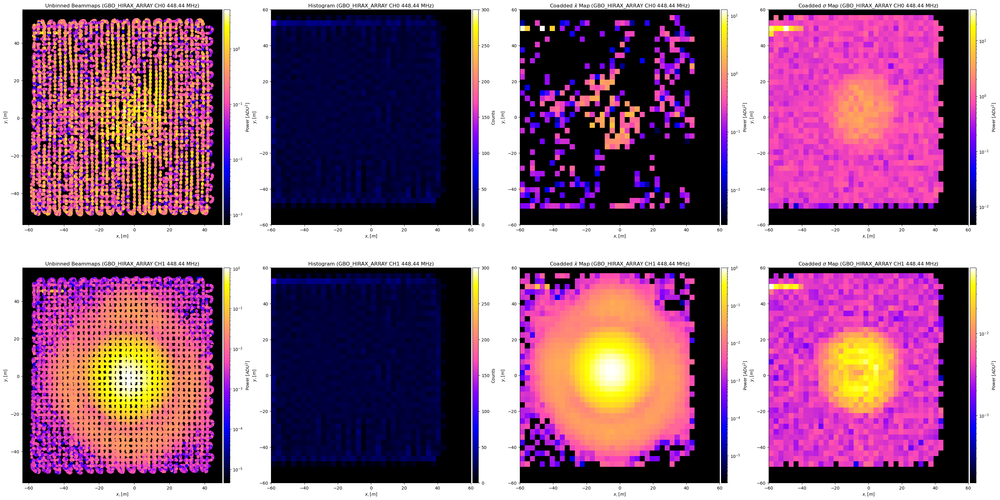

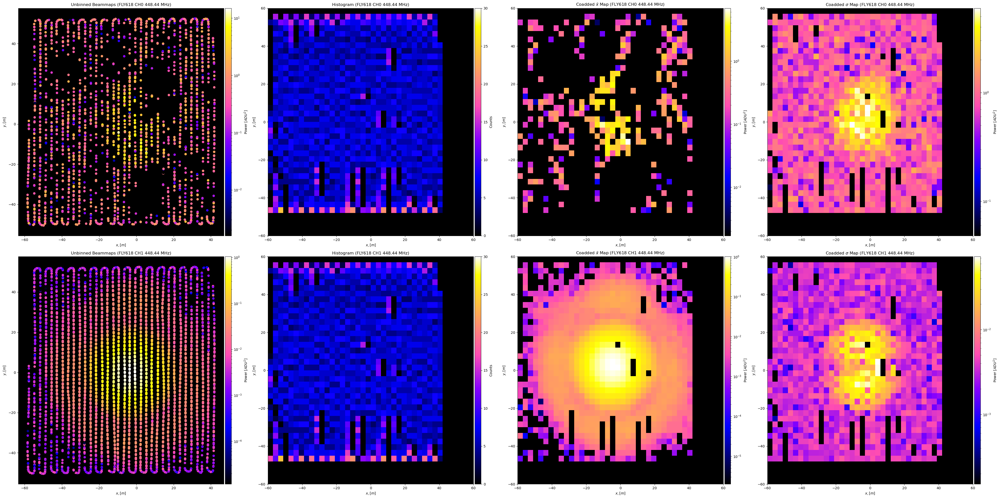

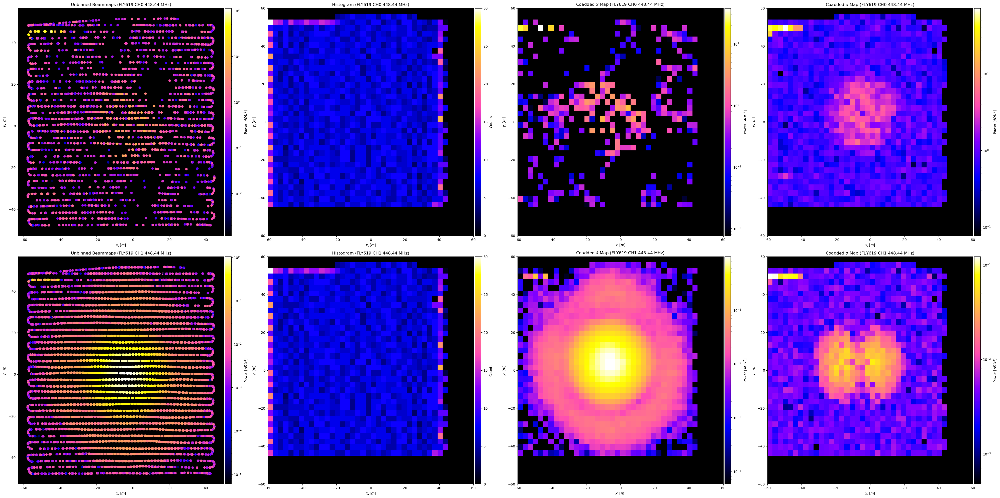

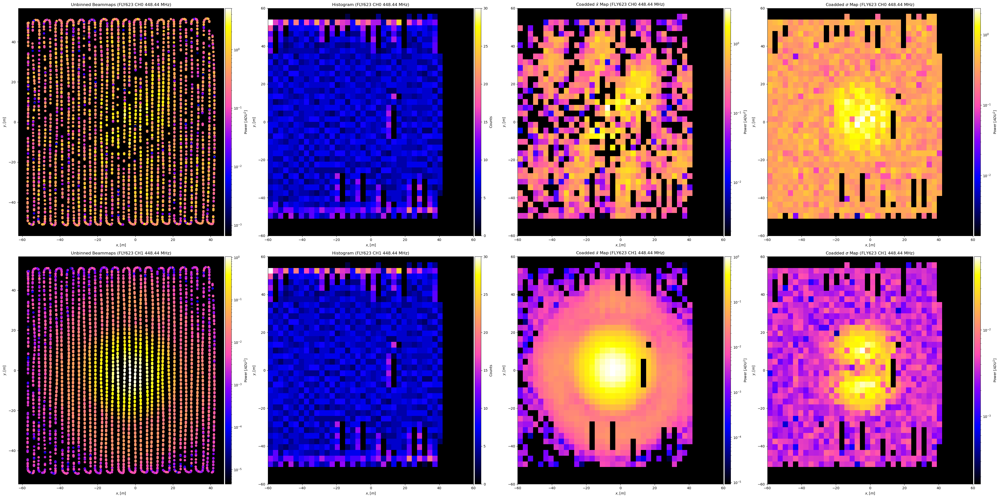

In [197]:
#testbeam_0=Beammap(concatlist=pcklarr[[1,2,11,12]],gfitlist=gfitarr[[1,2,11,12]],normalization='Gauss',operation='coadd',Xargs=[-110,110,3],Yargs=[-110,110,3])
#testbeam_1=Beammap(concatlist=pcklarr[[0,3,4,5,7,8,9,10]],gfitlist=gfitarr[[0,3,4,5,7,8,9,10]],normalization='Gauss',operation='coadd',Xargs=[-110,110,3],Yargs=[-110,110,3])
## Good resolution is [-60,60,2.5]?
testbeam=Beammap(flightmasterpath='/hirax/GBO_Analysis_Outputs/GBO_flights_forscripts.yaml',\
                 concatlist=pcklarr[[4,5,7]],gfitlist=gfitarr[[4,5,7]],normalization='Gauss',operation='coadd',Xargs=[-60,60,3],Yargs=[-60,60,3],Fargs=[899,901,1],f_index=900)
                 #concatlist=pcklarr[[4,5,7]],gfitlist=gfitarr[[4,5,7]],normalization='Gauss',operation='coadd',Xargs=[-60,60,2.5],Yargs=[-60,60,2.5],Fargs=[0,1024,1],f_index=900)

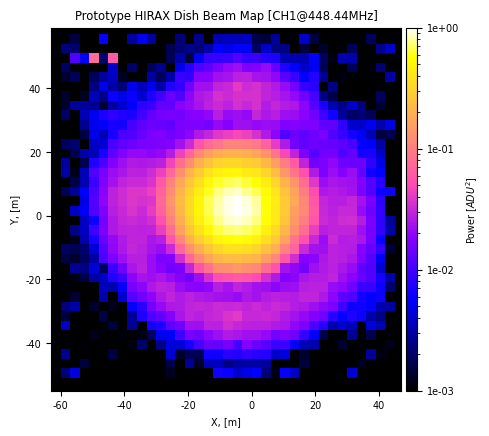

In [266]:
fig,ax1=subplots(nrows=1,ncols=1,figsize=(5,5),sharex=True,sharey=True)
ax1.set_facecolor('k')
find=1
chind=1
#ax1.scatter(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],c=np.abs(testbeam.V_LC_operation[:,:,find,1]),cmap='gnuplot2',s=5,norm=LogNorm())
im1=ax1.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],(testbeam.V_LC_operation[:,:,find,chind]).T,cmap='gnuplot2',norm=LogNorm(),clim=(1e-3,1e0))
images=[im1]
cbarlabels=['Power [$ADU^2$]','Counts','Power [$ADU^2$]','Power [$ADU^2$]']
for i,ax in enumerate([ax1]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('X, [m]',fontsize='x-small')
    ax.set_xlim(-63,47)
    ax.set_ylim(-55,59)
    ax.set_xticks(ax.get_xticks()[1:-1])
    ax.set_xticklabels(ax.get_xticks().astype(int)[:],fontsize='x-small')
    ax.set_ylabel('Y, [m]',fontsize='x-small')
    ax.set_yticks(ax.get_yticks()[1:-1])
    ax.set_yticklabels(ax.get_yticks().astype(int)[:],fontsize='x-small')
    ax.set(aspect='equal')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[i],cax=cax)
    cbar.set_label(cbarlabels[i],fontsize='x-small')
    cbar.set_ticks(cbar.get_ticks().astype(float)[1:-1],labels=["{:.0e}".format(k) for k in cbar.get_ticks()[1:-1]],fontsize='x-small')
    ax.set_title('Prototype HIRAX Dish Beam Map [CH1@448.44MHz]',fontsize='small')
tight_layout()


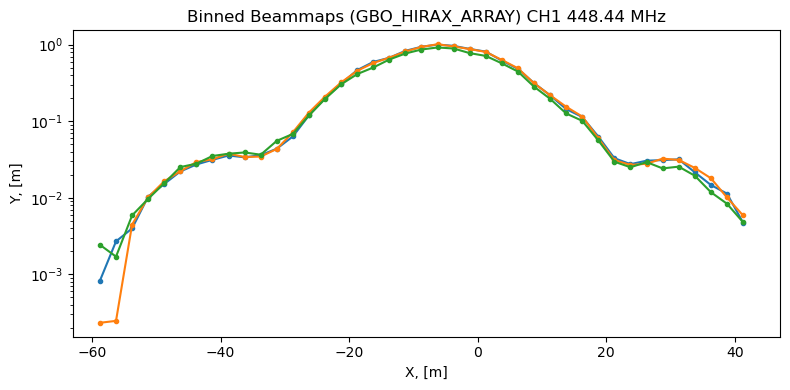

In [92]:
fig,ax1=subplots(nrows=1,ncols=1,figsize=(8,4))
find=1
chind=1
ax1.semilogy(testbeam.y_centers_grid[:,24,0],(testbeam.V_LC_operation[:,24,find,chind]),'.-')
ax1.semilogy(testbeam.y_centers_grid[:,25,0],(testbeam.V_LC_operation[:,25,find,chind]),'.-')
ax1.semilogy(testbeam.y_centers_grid[:,26,0],(testbeam.V_LC_operation[:,26,find,chind]),'.-')

for i,ax in enumerate([ax1]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('X, [m]')
    ax.set_xlim(-63,47)
    #ax.set_xticklabels(ax.get_xticks())
    #ax.set_xticks([])
    ax.set_ylabel('Y, [m]')
    #ax.set_yticklabels(ax.get_yticks())
    #ax.set_yticks([])
    #ax.set(aspect='equal')
    ax.set_title('Binned Beammaps (GBO_HIRAX_ARRAY) CH1 448.44 MHz')
tight_layout()

In [10]:
tlb,tub=[0,-1]
t_cut=concattest0826.inds_on
fig,[ax1,ax2]=subplots(nrows=1,ncols=2,figsize=(10,5))
ax1.plot(concattest0826.drone_xyz_per_dish_interp[0,tlb:tub,0],concattest0826.drone_xyz_per_dish_interp[0,tlb:tub,1])
ax2.plot(np.nanmax(concattest0825.V_bgsub[:,:,0],axis=0))
ax2.plot(np.nanmax(concattest0825.V_bgsub[:,:,1],axis=0))

NameError: name 'concattest0826' is not defined

NameError: name 'find' is not defined

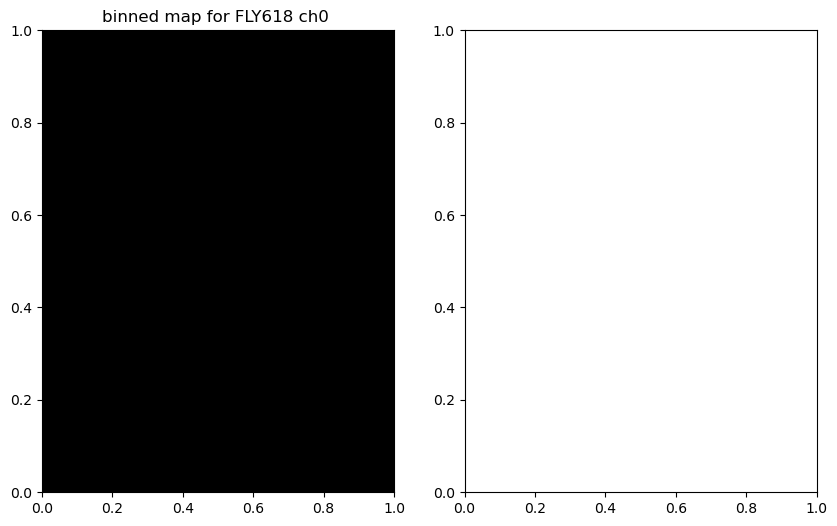

In [11]:
for ccind in range(len(testbeam.concat_list)):
    fig,[ax1,ax2]=subplots(nrows=1,ncols=2,figsize=(10,6))
    chind=0
    ax1.set_title('binned map for {} ch{} '.format(testbeam.concat_list[ccind].split('_')[0],chind))
    ax1.set_facecolor('k')
    im1=ax1.pcolormesh(testbeam.x_edges_grid[:,:,chind],testbeam.y_edges_grid[:,:,chind],testbeam.V_LC_mean[:,:,find,chind,ccind].T,cmap=cm.gnuplot2,norm=LogNorm())#,edgecolors='k')
    chind=1
    ax2.set_title('binned map for {} ch{} '.format(testbeam.concat_list[ccind].split('_')[0],chind))
    ax2.set_facecolor('k')
    im2=ax2.pcolormesh(testbeam.x_edges_grid[:,:,chind],testbeam.y_edges_grid[:,:,chind],testbeam.V_LC_mean[:,:,find,chind,ccind].T,cmap=cm.gnuplot2,norm=LogNorm())#,edgecolors='k')

NameError: name 'concattest0825' is not defined

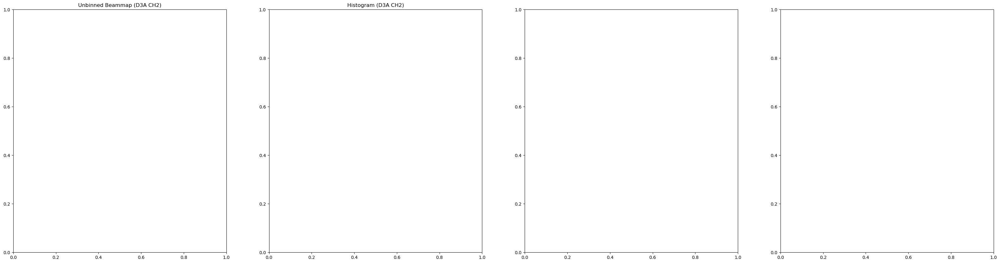

In [12]:
find=900
chind=1
ccind=0
fig,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(40,10))
ax1.set_title('Unbinned Beammap (D3A CH{})'.format(2))
ax2.set_title('Histogram (D3A CH{})'.format(2))
ax3.set_title(r'Coadded $\bar{x}$'+' Map (D3A CH{} {:.2f} MHz)'.format(2,concattest0825.freq[find]))
ax4.set_title('Coadded $\sigma$ Map (D3A CH{} {:.2f} MHz)'.format(2,concattest0825.freq[find]))
t_cut=concattest0825.inds_on
im1=ax1.scatter(concattest0825.drone_xyz_per_dish_interp[chind,t_cut,0],concattest0825.drone_xyz_per_dish_interp[chind,t_cut,1],c=concattest0825.V_bgsub[t_cut,find,0],cmap=cm.gnuplot2,norm=LogNorm())
t_cut=concattest0826.inds_on
im1=ax1.scatter(concattest0826.drone_xyz_per_dish_interp[chind,t_cut,0],concattest0826.drone_xyz_per_dish_interp[chind,t_cut,1],c=concattest0826.V_bgsub[t_cut,find,0],cmap=cm.gnuplot2,norm=LogNorm())
#ax1.set_xlim(testbeam.x_edges[0,2],testbeam.x_edges[-1,2])
#ax1.set_ylim(testbeam.y_edges[0,2],testbeam.y_edges[-1,2])
# im2=ax2.pcolormesh(testbeam.x_edges_grid[:,:,chind],testbeam.y_edges_grid[:,:,chind],np.nansum(testbeam.histogram_LC[:,:,chind,:],axis=2).T,cmap=cm.gnuplot2)#,edgecolors='k')
# im2.set_clim(0,50)
# im3=ax3.pcolormesh(testbeam.x_edges_grid[:,:,chind],testbeam.y_edges_grid[:,:,chind],np.nanmean(testbeam.V_LC_mean[:,:,find,chind,:],axis=2).T,cmap=cm.gnuplot2,norm=LogNorm())#,edgecolors='k')
# im4=ax4.pcolormesh(testbeam.x_edges_grid[:,:,chind],testbeam.y_edges_grid[:,:,chind],np.nanmean(testbeam.V_LC_std[:,:,find,chind,:],axis=2).T,cmap=cm.gnuplot2,norm=LogNorm())#,edgecolors='k')
im2=ax2.pcolormesh(testbeam.x_edges_grid[:,:,chind],testbeam.y_edges_grid[:,:,chind],np.nansum(testbeam.histogram_LC[:,:,chind,:],axis=2).T,cmap=cm.gnuplot2)#,edgecolors='k')
im2.set_clim(0,300)
im3=ax3.pcolormesh(testbeam.x_edges_grid[:,:,chind],testbeam.y_edges_grid[:,:,chind],testbeam.V_LC_operation[:,:,find,chind].T,cmap=cm.gnuplot2,norm=LogNorm())#,edgecolors='k')
im4=ax4.pcolormesh(testbeam.x_edges_grid[:,:,chind],testbeam.y_edges_grid[:,:,chind],np.nanmean(testbeam.V_LC_std[:,:,find,chind,:],axis=2).T,cmap=cm.gnuplot2,norm=LogNorm())#,edgecolors='k')

images=[im1,im2,im3,im4]
cbarlabels=['Power [$ADU^2$]','Counts','Power [$ADU^2$]','Power [$ADU^2$]']
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    #ax.plot(testbeam.x_centers_grid,testbeam.y_centers_grid,'c.',markersize=2,alpha=0.3)
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[i],cax=cax)
    cbar.set_label(cbarlabels[i])
tight_layout()


        
        




In [13]:
len(concattest0825.t_arr_datetime)
plot(testbeam.x_centers[:,0],testbeam.V_LC_mean[:,29,find,chind,0],'.-')
plot(testbeam.x_centers[:,0],testbeam.V_LC_mean[29,:,find,chind,0],'.-')

NameError: name 'concattest0825' is not defined

In [14]:
plot(concattest0825.dish_coords[:,0],concattest0825.dish_coords[:,1],'.')
plot(concattest0825.drone_xyz_per_dish_interp[0,:,0],concattest0825.drone_xyz_per_dish_interp[0,:,1])
plot(concattest0825.drone_xyz_per_dish_interp[2,:,0],concattest0825.drone_xyz_per_dish_interp[2,:,1])

NameError: name 'concattest0825' is not defined

(16, 1024)


NameError: name 'concattest0825' is not defined

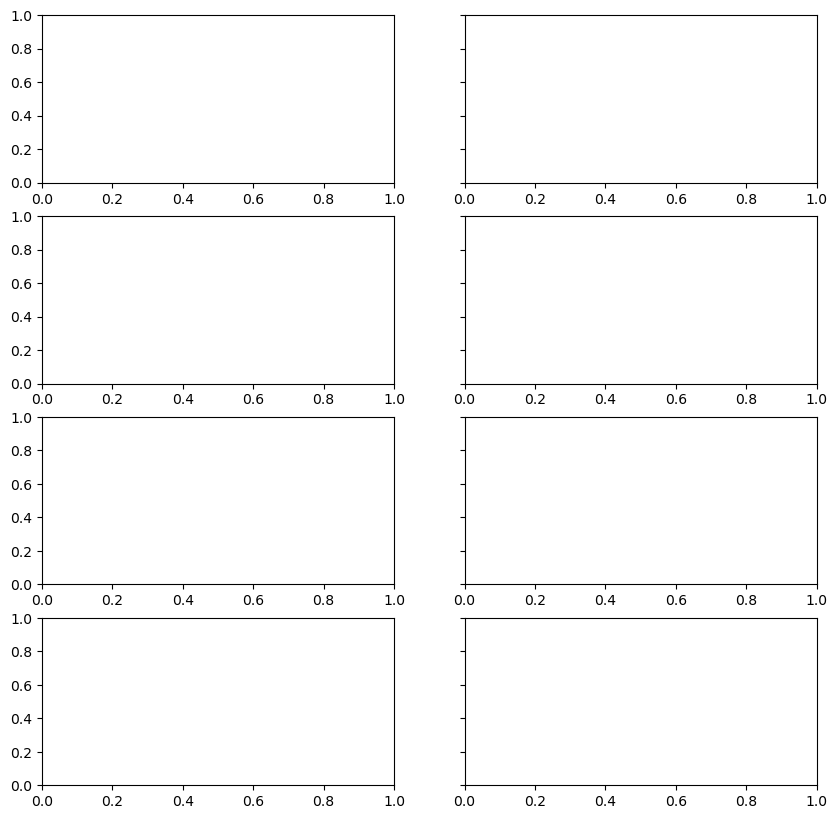

In [15]:
with np.load(fitdir+'FLY533_20210826T182904Z_2dGauss_and_Airy_Params.npz') as gfile:
    g_A=gfile['G_popt'][:,:,0]
    g_x=gfile['G_popt'][:,:,1]
    g_y=gfile['G_popt'][:,:,3]
    gk=gfile['G_PR']
print(g_x.shape)
fig,axes=subplots(ncols=2,nrows=4,sharey=True,figsize=(10,10))
for i,ax in enumerate(axes.flatten()):
    ax.plot(concattest0825.freq,g_x[i,:]-concattest0825.dish_coords[i,0],'.')
    ax.plot(concattest0825.freq,g_y[i,:]-concattest0825.dish_coords[i,1],'.')
    ax.axhline(concattest0825.dish_coords[i,0])
    ax.axhline(concattest0825.dish_coords[i,1])

NameError: name 'concattest0826' is not defined

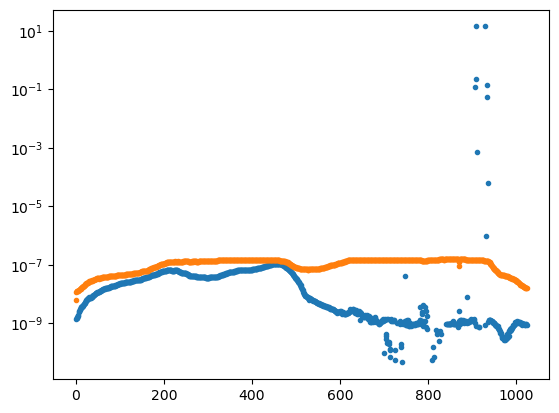

In [16]:
semilogy(g_A[0,:],'.')
semilogy(g_A[1,:],'.')

for i,inds_pairs in enumerate(np.arange(concattest0826.n_channels).reshape(int(concattest0826.n_channels/2),2)):
    pol0,pol1=inds_pairs
    np.nanmean(np.nanmax(g_A[pol0,:]))
    np.nanmean(np.nanmax(g_A[pol1,:]))

In [2]:
cringe=np.outer(concattest0825.drone_xyz_per_dish_interp,np.ones(1024)).reshape((concattest0825.drone_xyz_per_dish_interp.shape+(1024,)))

NameError: name 'concattest0825' is not defined

In [3]:
tmpcoords=np.ones(concattest0825.drone_xyz_per_dish_interp.shape+(1024,)).shape
tmpcoords[:,:,:,j]=concattest0825.drone_xyz_per_dish_interp.shape

NameError: name 'concattest0825' is not defined

In [4]:
## Need to add the corrections to the original drone coords per dish, along the frequency axis:
tmpcoords=np.repeat(concattest0825.drone_xyz_per_dish_interp[:,:,:,np.newaxis],len(testbeam.freq),axis=3)
shiftvec=np.array((testbeam.x_offsets[:,:,h],testbeam.y_offsets[:,:,h],np.zeros(testbeam.x_offsets[:,:,h].shape)))
tmpshifts=np.repeat(np.swapaxes(np.swapaxes(shiftvec,0,2),1,2)[:,np.newaxis,:,:],len(concattest0825.t),axis=1)
fccoords=tmpcoords+tmpshifts
fccoords.shape

NameError: name 'concattest0825' is not defined

In [5]:
((5*np.ones((5,5)))**-1).shape

(5, 5)

In [6]:
[plot(fccoords[1,:,0,k],fccoords[1,:,1,k]) for k in range(30)]

NameError: name 'fccoords' is not defined

In [7]:
binned_statistic_2d(x=concattest0825.drone_xyz_per_dish_interp[0,:,0],\
                    y=concattest0825.drone_xyz_per_dish_interp[0,:,1],\
                    values=concattest0825.drone_xyz_per_dish_interp[0,:,0],\
                    statistic='mean',\
                    bins=[testbeam.x_edges[:,0],testbeam.y_edges[:,0]]
                   ).statistic


NameError: name 'concattest0825' is not defined

In [8]:
(concattest0825.drone_xyz_per_dish_interp.shape+(1024,))


np.freq(

SyntaxError: unexpected EOF while parsing (<ipython-input-8-ab66637416de>, line 4)

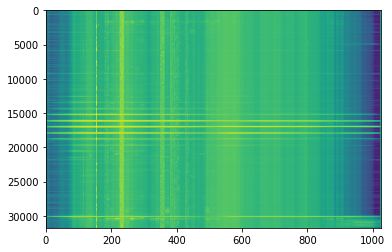

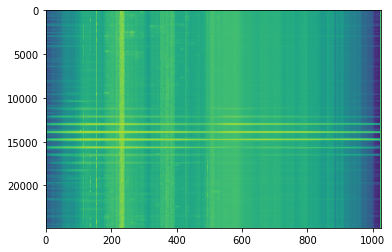

In [86]:
imshow(corrtest0825.V[:,::-1,1],aspect='auto',norm=LogNorm())
figure()
imshow(corrtest0826.V[:,::-1,0],aspect='auto',norm=LogNorm())


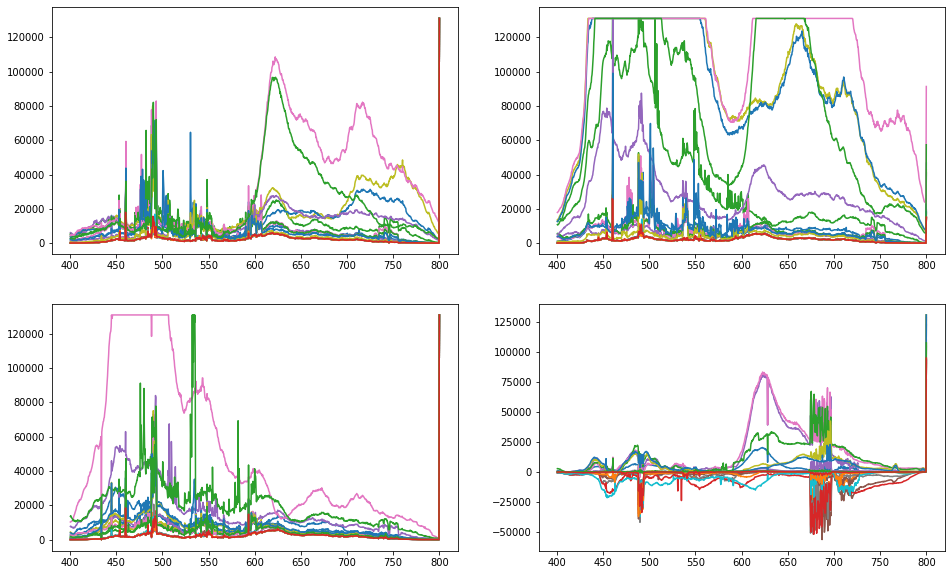

In [79]:
fig,[[ax1,ax2],[ax3,ax4]]=subplots(ncols=2,nrows=2,figsize=(16,10))
for x in range(58,70):
    real_fd=h5py.File(corrtest0825.Data_Directory+corrtest0825.filenames[x], 'r')
    real_vis=np.real(real_fd['vis'][:])
    #plot(np.nanmean(corrtest0825.V[:,::-1,1],axis=1))
    ax1.plot(corrtest0825.freq,np.nanmax(real_vis[:,::,0],axis=0),label=str(x))
    ax1.plot(corrtest0825.freq,np.nanmin(real_vis[:,::,0],axis=0),label=str(x))
    ax2.plot(corrtest0825.freq,np.nanmax(real_vis[:,::,16],axis=0),label=str(x))
    ax2.plot(corrtest0825.freq,np.nanmin(real_vis[:,::,16],axis=0),label=str(x))
    
    real_fd=h5py.File(corrtest0826.Data_Directory+corrtest0825.filenames[x], 'r')
    real_vis=np.real(real_fd['vis'][:])
    #plot(np.nanmean(corrtest0825.V[:,::-1,1],axis=1))
    ax3.plot(corrtest0825.freq,np.nanmax(real_vis[:,::,0],axis=0),label=str(x))
    ax3.plot(corrtest0825.freq,np.nanmin(real_vis[:,::,0],axis=0),label=str(x))
    ax4.plot(corrtest0825.freq,np.nanmax(real_vis[:,::,16],axis=0),label=str(x))
    ax4.plot(corrtest0825.freq,np.nanmin(real_vis[:,::,16],axis=0),label=str(x))
#legend()

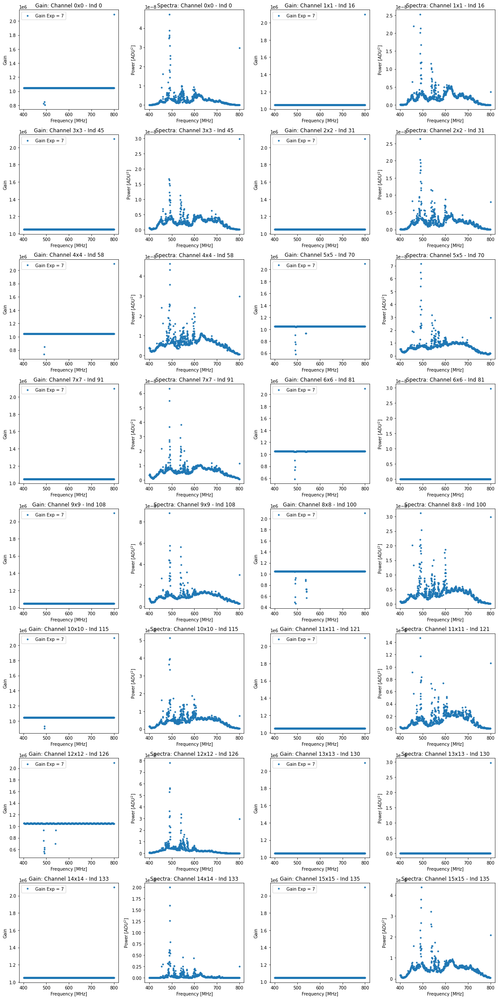

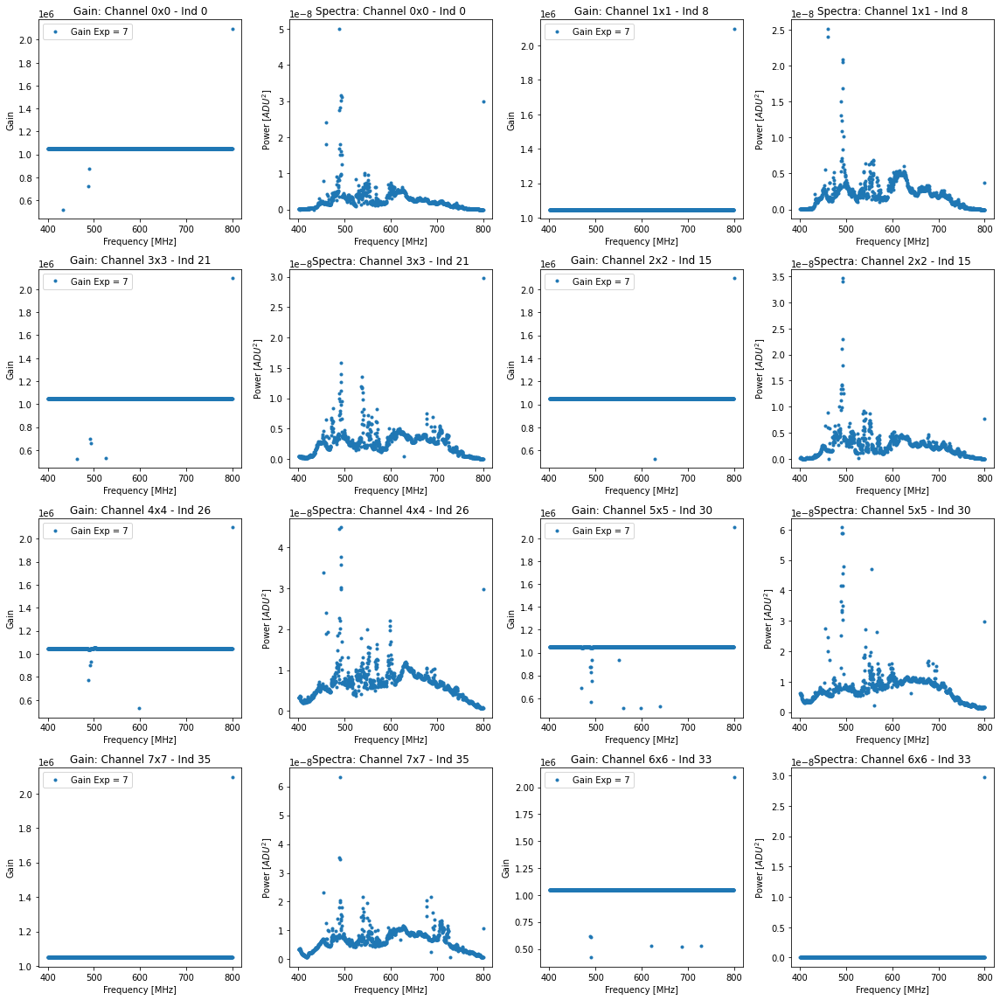

In [63]:
pu.Plot_Gains_vs_Data(corrtest0825)
pu.Plot_Gains_vs_Data(corrtest0826)

In [ ]:
## 1) 0825 -- Flight from 20210826T185621: Comments only include "Large Grid 3"
#stop #prevent rerun
## Read in the Corr_Data class:
datadir='/hirax/GBO_Aug_2021/TONE_ACQ/20210826T182904Z_yale_drone/corr/20210826T182915Z/'
gaindir='/hirax/GBO_Aug_2021/TONE_ACQ/digital_gains/20210826T182904Z_yale_drone_yale_digitalgain/'
corrtest0825=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite,crossmap=[1])

## Read in the Drone_Data class:
dronedir='/hirax/all_drone_data/datcon_csv/'
dronetest0825=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY533.csv',site_class=gbosite)

## Since we know the data are from the same time we can combine them with the Concat_Class:
#plot(dronetest0825.t_arr_datetime)
#plot(corrtest0825.t_arr_datetime)
concattest0825=concat.CONCAT(CORRDATCLASS=corrtest0825,DRONEDATCLASS=dronetest0825,load_yaml=False)

## Use the Extract_Source_Pulses and Perform_Background_Subtraction functions:
concattest0825.Extract_Source_Pulses(Period=0.4e6,Dutycycle=0.2e6,t_bounds=[14500,15000])
concattest0825.Perform_Background_Subtraction()
concattest0825.Synchronization_Function(inputcorr=corrtest0825,inputdrone=dronetest0825,FMB_coordbounds=[50.0,50.0,150.0],FMB_ampbound=0.999)
#concattest0825.Export_yaml()
concattest0825.Main_Beam_Fitting()

Initializing Correlator Class using:
  --> /hirax/GBO_Aug_2021/TONE_ACQ/20210826T182904Z_yale_drone/corr/20210826T182915Z/
  --> Arrays initialized with shape (124, 256, 1024, 16)
Assigning array values by reading in data files:
  --> Loading File: 0006/0123

Initializing Correlator Class using:
  --> /hirax/GBO_Aug_2021/TONE_ACQ/20210826T185621Z_yale_drone/corr/20210826T185632Z/
  --> Arrays initialized with shape (97, 256, 1024, 8)
Assigning array values by reading in data files:
  --> Loading File: 0096/0096
  --> Finished. Reshaping arrays.
Initializing drone data via datcon_csv routine: FLY534.csv
  --> Skipping rows 1 to 499 to eliminate NAN values
  --> Attempting to load position data from RTK
    --> RTK data contains 12316/12316 non-nan values
Timestamp interpolation succeeded
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.
Initializing CONCAT CLASS with active traceback using:
  --> /hirax/GBO_Aug_2021/TONE_ACQ/20210826T185621Z_yale_drone/corr/20210826T185632Z/
  --> FLY534.csv
Creating directory for saving traceback and analysis outputs:
  --> /hirax/GBO_Analysis_Outputs/FLY534_20210826T185621Z_ver_20230410T184336/
Concat 

/home/tyndall/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Applying a time correction of -1.40 seconds using Channel 0 fits.
  --> Variable synchronation successful, generating output plots:
  --> Saving output plot.
Performing 2DGauss and Airy fits for [8]chans x [1024]freqs:


/home/tyndall/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/tyndall/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3875: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coefficent may be inaccurate.
  warnings.warn(PearsonRNearConstantInputWarning())


  --> Saving output fit parameters as an .npz filetype:
  --> FLY534_20210826T185621Z_ver_20230410T184336_2dGauss_and_Airy_Params.npz


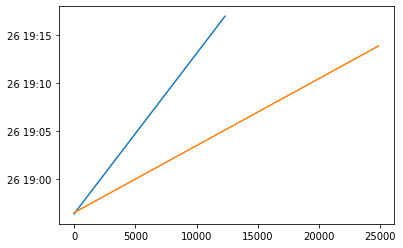

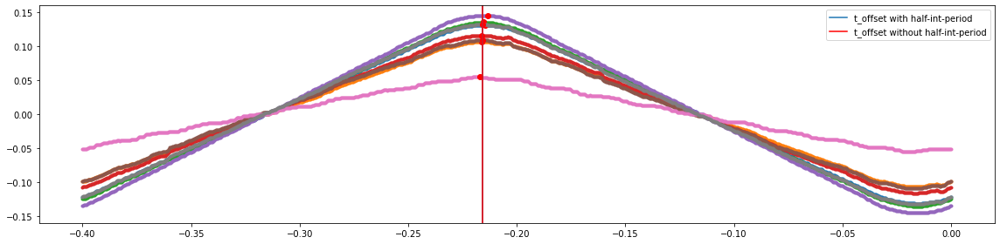

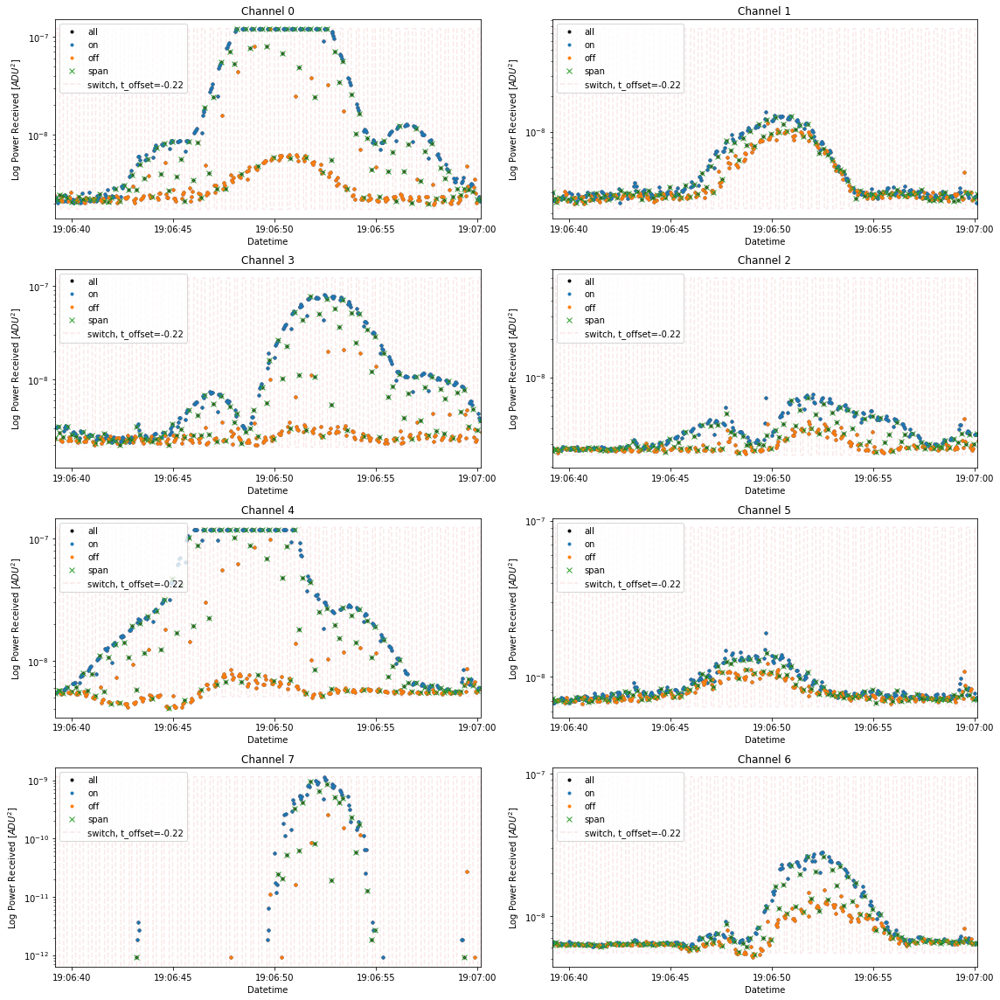

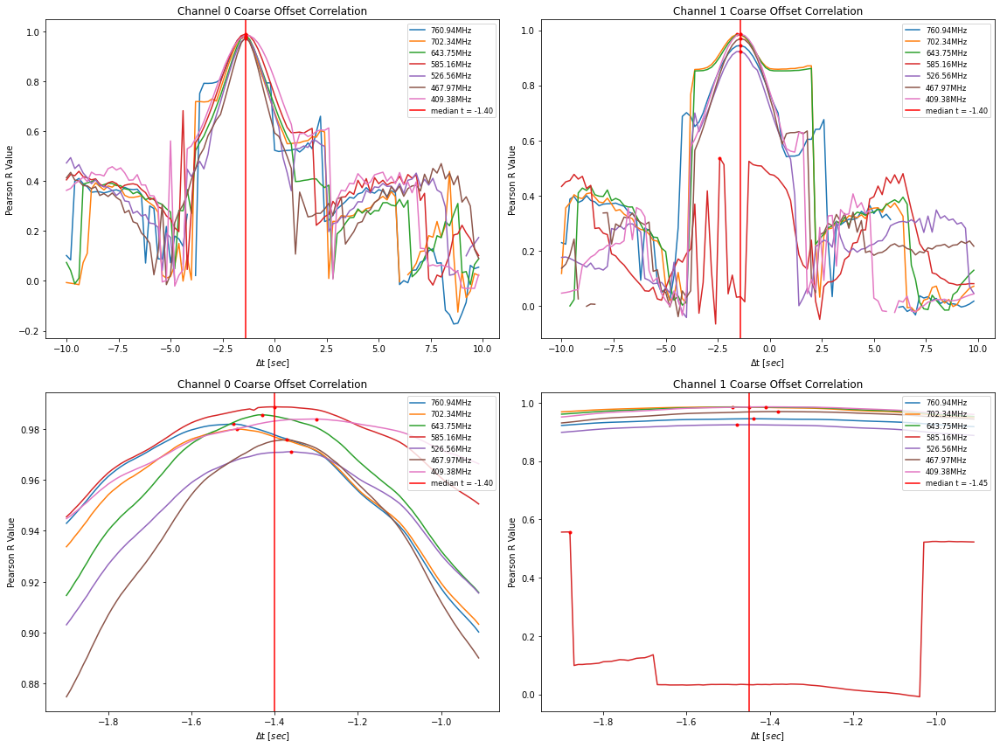

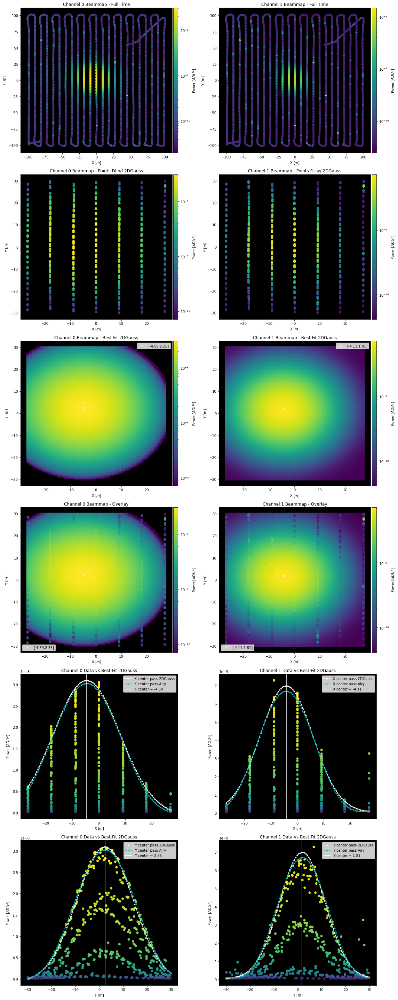

In [71]:
## 2) 0826 -- Flight from 20210826T185621: Comments only include "Large Grid 3"

## Read in the Corr_Data class:
datadir='/hirax/GBO_Aug_2021/TONE_ACQ/20210826T185621Z_yale_drone/corr/20210826T185632Z/'
gaindir='/hirax/GBO_Aug_2021/TONE_ACQ/digital_gains/20210826T185621Z_yale_drone_yale_digitalgain/'
corrtest0826=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite,crossmap=[1])

## Read in the Drone_Data class:
dronedir='/hirax/all_drone_data/datcon_csv/'
dronetest0826=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY534.csv',site_class=gbosite)

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(dronetest0826.t_arr_datetime)
plot(corrtest0826.t_arr_datetime)
concattest0826=concat.CONCAT(CORRDATCLASS=corrtest0826,DRONEDATCLASS=dronetest0826,load_yaml=False)

## Use the Extract_Source_Pulses and Perform_Background_Subtraction functions:
concattest0826.Extract_Source_Pulses(Period=0.4e6,Dutycycle=0.2e6,t_bounds=[14500,15000])
concattest0826.Perform_Background_Subtraction()
concattest0826.Synchronization_Function(inputcorr=corrtest0826,inputdrone=dronetest0826)
#concattest0826.Export_yaml()
concattest0826.Main_Beam_Fitting()

In [ ]:
## D3A Data version: Old, don't touch
stop

Initializing Correlator Class using:
  --> /media/tyndall/extradrive1/D3A_data/20221103T233347Z_D3A/corr/20221103T233359Z/
  --> Arrays initialized with shape (399, 64, 1024, 4)
Assigning array values by reading in data files:
  --> Loading File: 0398/0398
  --> Finished. Reshaping arrays.
Initializing drone data via datcon_csv routine: FLY777.csv
  --> Skipping rows 1 to 499 to eliminate NAN values
  --> Attempting to load position data from RTK
    --> RTK data contains 17079/17079 non-nan values
Timestamp interpolation succeeded
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.
Initializing CONCAT CLASS with active traceback using:
  --> /media/tyndall/extradrive1/D3A_data/20221103T233347Z_D3A/corr/20221103T233359Z/
  --> FLY777.csv
  --> Traceback outputs will not be saved...
Concat initialized without previous config file...
Interpolating drone coordinates for each correlator 

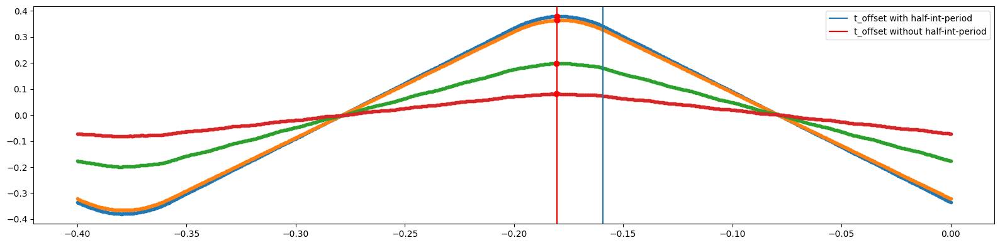

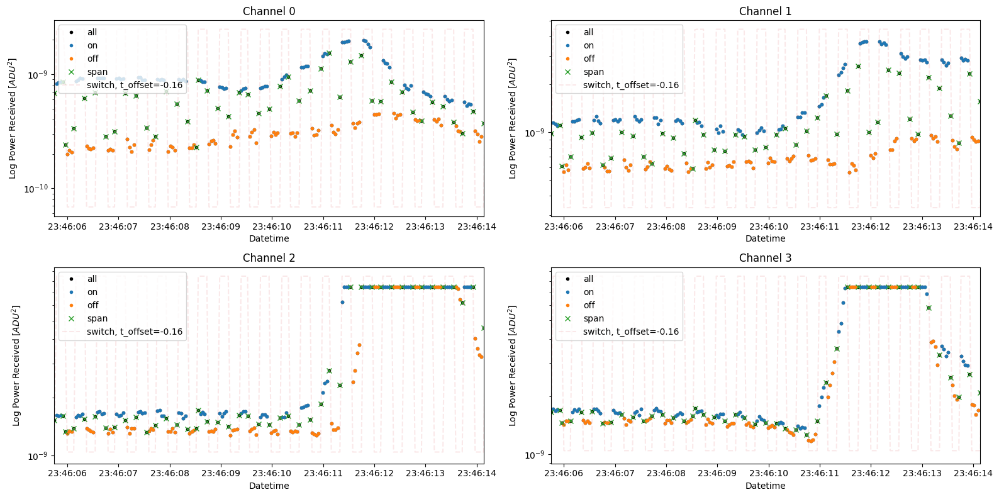

In [2]:
gaindir='/media/tyndall/extradrive1/D3A_data/digital_gains/20221103T233347Z_D3A_digitalgain/'
datadir='/media/tyndall/extradrive1/D3A_data/20221103T233347Z_D3A/corr/20221103T233359Z/'
nfcorr=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=d3asite,crossmap=[1])

dronedir="/media/tyndall/extradrive1/20221031_D3A_DJI_Data/"
nfdrone=drone.Drone_Data(dronedir,'FLY777.csv',site_class=d3asite)

nfconcat=concat.CONCAT(CORRDATCLASS=nfcorr,DRONEDATCLASS=nfdrone,\
                       config_directory="/media/tyndall/extradrive1/D3A_data/outputs/",\
                       output_directory="/media/tyndall/extradrive1/D3A_data/outputs/",\
                       load_yaml=False,save_traceback=False)
#nfconcat.t_delta_pulse=-.17
## Use the Extract_Source_Pulses and Perform_Background_Subtraction functions: (NO PULSING!)
nfconcat.Extract_Source_Pulses(Period=0.4e6,Dutycycle=0.2e6,t_bounds=[10000,10200],f_ind=900)
nfconcat.Perform_Background_Subtraction(window_size=10)
#nfconcat.Export_yaml()
#nfconcat.Main_Beam_Fitting()

[12, 17] [795.3125   793.359375]


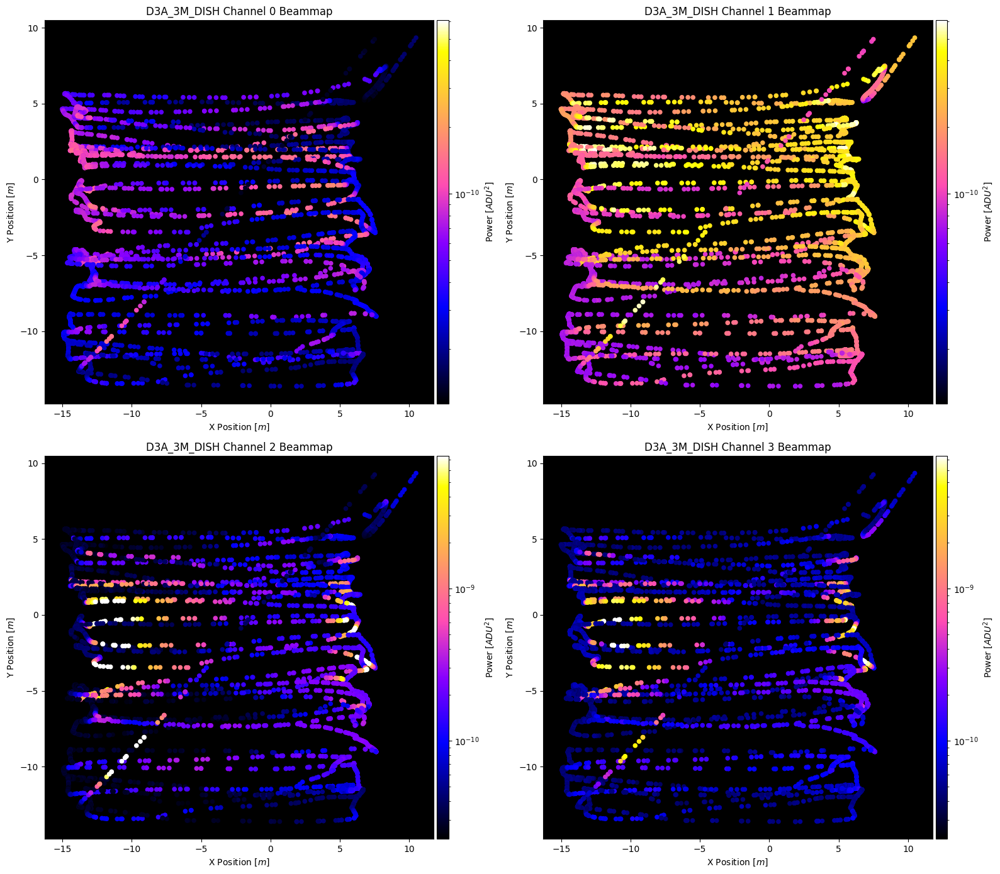

In [3]:
tbds=[6700,21400] # good solution with no BS
tbds=[6490,21590] # add back in our bad line:
#tbds=[0,-1]
tlb,tub=tbds
for k in np.sort(np.concatenate((np.arange(12,1022,17),np.arange(17,1022,17)))).reshape(60,2).tolist()[:1]:
    print(k,nfconcat.freq[k])
    pu.Plot_Beammap(concat_class=nfconcat,t_bounds=[tbds[0],tbds[1]],\
                    pulse_args='on',coord_args='LC',dotsize=20,f_bounds=[k[0],k[1]])

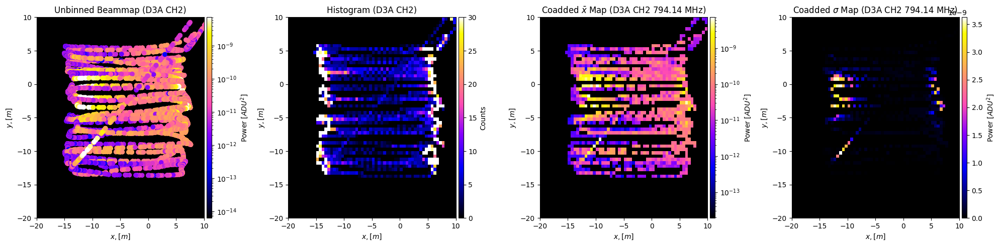

In [6]:
fig,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(20,5))
ax1.set_title('Unbinned Beammap (D3A CH{})'.format(2))
ax2.set_title('Histogram (D3A CH{})'.format(2))
ax3.set_title(r'Coadded $\bar{x}$'+' Map (D3A CH{} {:.2f} MHz)'.format(2,nfconcat.freq[15]))
ax4.set_title('Coadded $\sigma$ Map (D3A CH{} {:.2f} MHz)'.format(2,nfconcat.freq[15]))
im1=ax1.scatter(nfconcat.drone_xyz_per_dish_interp[2,tlb:tub,0],nfconcat.drone_xyz_per_dish_interp[2,tlb:tub,1],\
                c=nfconcat.V_bgsub[tlb:tub,15,2],cmap=cm.gnuplot2,norm=LogNorm())
ax1.set_xlim(testbeam.x_edges[0,2],testbeam.x_edges[-1,2])
ax1.set_ylim(testbeam.y_edges[0,2],testbeam.y_edges[-1,2])
im2=ax2.pcolormesh(testbeam.x_edges_grid[:,:,2],testbeam.y_edges_grid[:,:,2],testbeam.histogram_LC[:,:,2,0].T,\
                   clim=(0,30),cmap=cm.gnuplot2)#,edgecolors='k')
im3=ax3.pcolormesh(testbeam.x_edges_grid[:,:,2],testbeam.y_edges_grid[:,:,2],testbeam.V_LC_mean[:,:,15,2,0].T,\
                   cmap=cm.gnuplot2,norm=LogNorm())#,edgecolors='k')
im4=ax4.pcolormesh(testbeam.x_edges_grid[:,:,2],testbeam.y_edges_grid[:,:,2],testbeam.V_LC_std[:,:,15,2,0].T,\
                   cmap=cm.gnuplot2,)#norm=LogNorm())#,edgecolors='k')
images=[im1,im2,im3,im4]
cbarlabels=['Power [$ADU^2$]','Counts','Power [$ADU^2$]','Power [$ADU^2$]']
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    #ax.plot(testbeam.x_centers_grid,testbeam.y_centers_grid,'c.',markersize=2,alpha=0.3)
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[i],cax=cax)
    cbar.set_label(cbarlabels[i])
tight_layout()


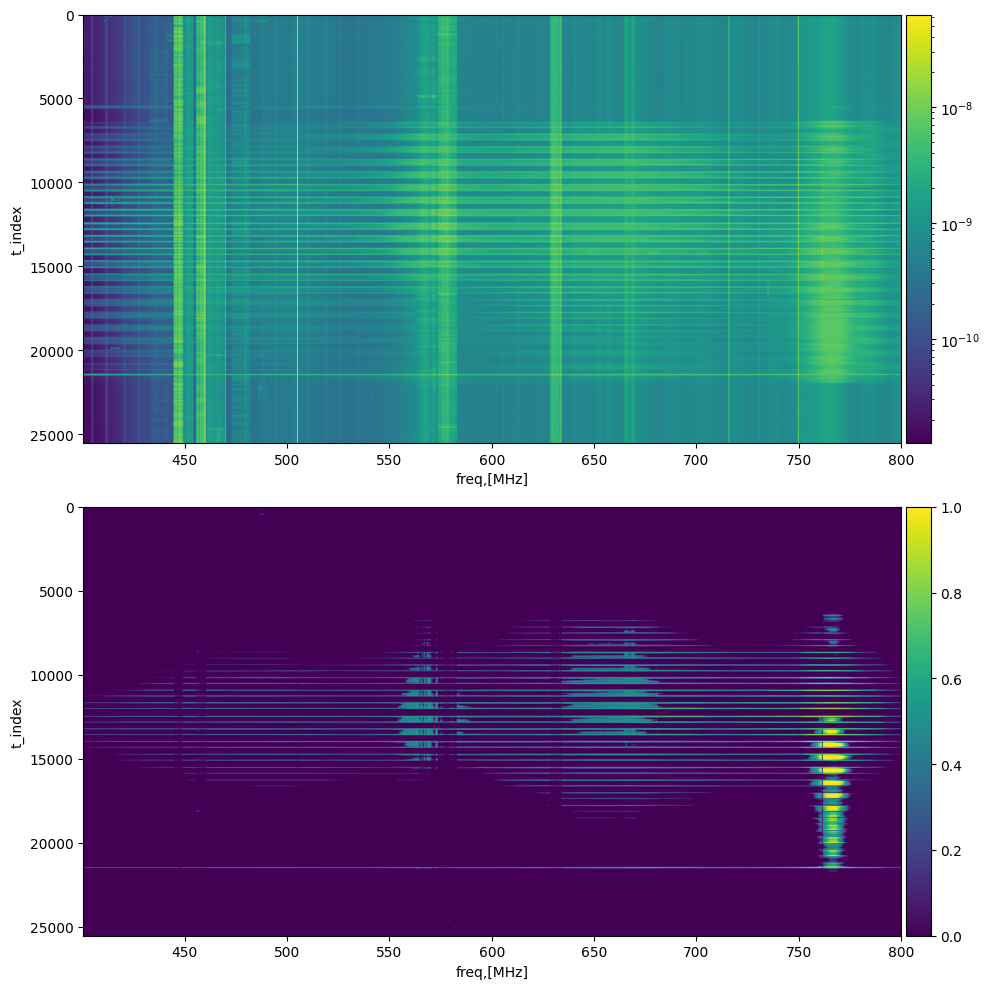

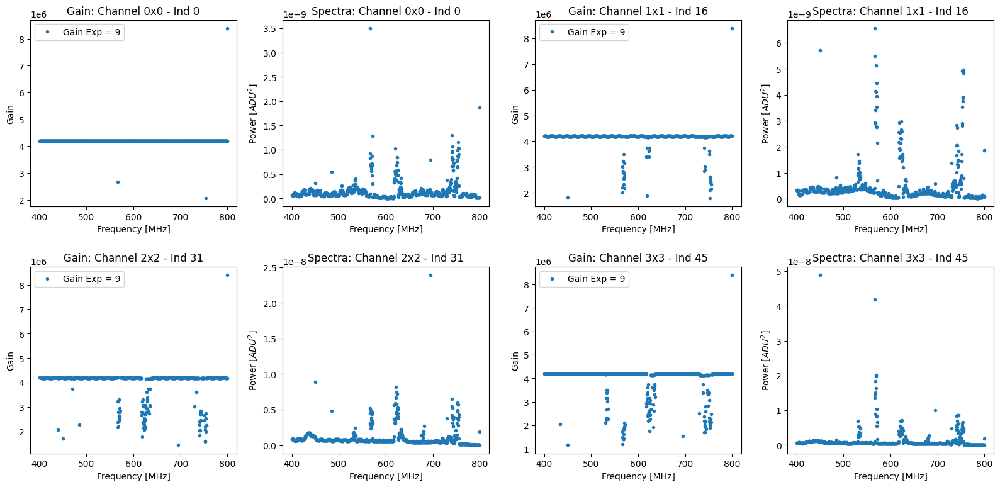

In [25]:
fig,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(10,10))
im1=ax1.imshow(nfcorr.V[:,:,2],extent=[nfcorr.freq[-1],nfcorr.freq[0],nfcorr.t_index[-1],nfcorr.t_index[0]],aspect='auto',norm=LogNorm())
im2=ax2.imshow(nfcorr.sat[:,:,2],extent=[nfcorr.freq[-1],nfcorr.freq[0],nfcorr.t_index[-1],nfcorr.t_index[0]],aspect='auto')

images=[im1,im2]
for i,ax in enumerate([ax1,ax2]):
    #ax.plot(testbeam.x_centers_grid,testbeam.y_centers_grid,'c.',markersize=2,alpha=0.3)
    #ax.set_facecolor('k')
    ax.set_xlabel('freq,[MHz]')
    ax.set_ylabel('t_index')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[i],cax=cax)
    #cbar.set_label(cbarlabels[i])
tight_layout()

pu.Plot_Gains_vs_Data(nfcorr)


In [7]:
## PRE MODULE VARS:
stop

NameError: name 'stop' is not defined

In [8]:
#create xvect [xgrid] and yvect [ygrid], coord vectors for spatial x and y over telescope FOV in cartesian:
ccmin,ccmax,ccres=[-20,10,0.3]
xedges,yedges=(cedges([ccmin,ccmax,ccres]),cedges([ccmin,ccmax,ccres]))
xedgesgrid,yedgesgrid=np.meshgrid(xedges,yedges)
xcenters,ycenters=(cedges([ccmin,ccmax,ccres])[:-1]+ccres/2.0,cedges([ccmin,ccmax,ccres])[:-1]+ccres/2.0)
xcentersgrid,ycentersgrid=np.meshgrid(xcenters,ycenters)
print('edges grids dims:',xedgesgrid.shape,yedgesgrid.shape)
print('centers grids dims:',xcentersgrid.shape,ycentersgrid.shape)

edges grids dims: (101, 101) (101, 101)
centers grids dims: (100, 100) (100, 100)


hist grid dims: (100, 100)


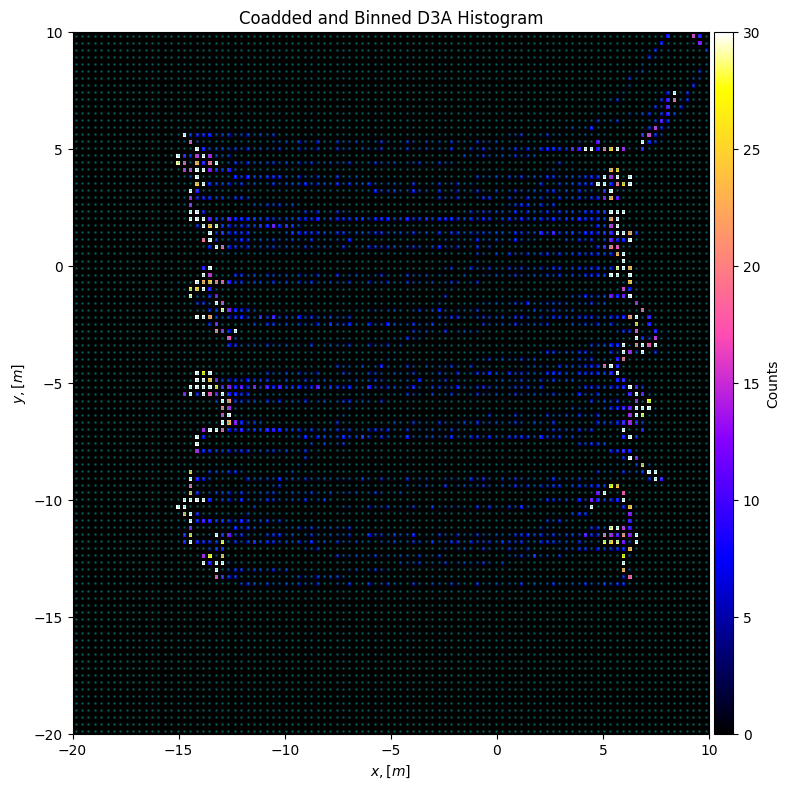

In [9]:
#get the x,y coords from time domain data:
x,y=[nfconcat.drone_xyz_LC_interp[:,0],nfconcat.drone_xyz_LC_interp[:,1]]
hist,xbins,ybins=np.histogram2d(x=x,y=y,bins=[xedges,yedges])
print('hist grid dims:',hist.shape)

fig,ax=subplots(nrows=1,ncols=1,figsize=(8,8))
im1=ax.pcolormesh(xedgesgrid,yedgesgrid,hist.T,clim=(0,30),cmap=cm.gnuplot2,edgecolors='k')
ax.plot(xcentersgrid,ycentersgrid,'c.',markersize=2,alpha=0.3)
ax.set_facecolor('k')
ax.set_title('Coadded and Binned D3A Histogram')
ax.set_xlabel('$x,[m]$')
ax.set_ylabel('$y, [m]$')
divider=make_axes_locatable(ax)
cax=divider.append_axes("right", size="3%", pad=0.05)
cbar=fig.colorbar(im1,cax=cax)
cbar.set_label('Counts')
tight_layout()

(25536, 1024, 4)
(100, 100, 1024, 4)


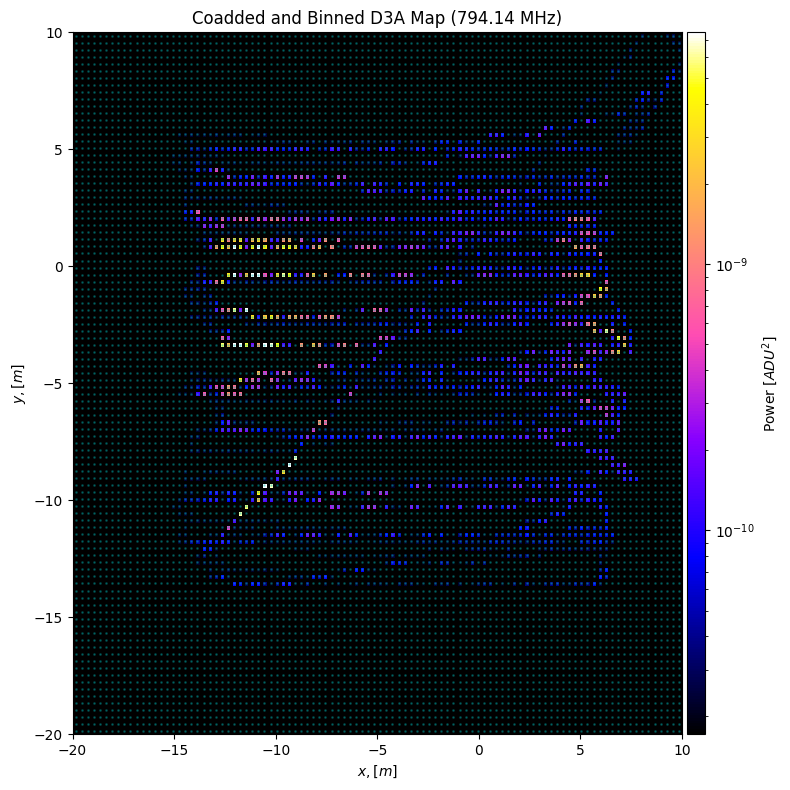

In [10]:
print(nfconcat.V_bgsub.shape)
V_rm=np.NAN*np.ones((xcentersgrid.shape[0],xcentersgrid.shape[1],nfconcat.V.shape[1],nfconcat.V.shape[2]))

xnz,ynz=np.where(hist!=0)
#print(xnz,ynz)
for i in range(len(xnz)):
    j,k=[xnz[i],ynz[i]]
    xacc=np.intersect1d(np.where(xedges[j]<=x),np.where(xedges[j+1]>x))
    yacc=np.intersect1d(np.where(yedges[k]<=y),np.where(yedges[k+1]>y))
    tacc=np.intersect1d(xacc,yacc)
    #print(i)
    #print(tacc)
    V_rm[j,k,:,:]=np.nanmean(nfconcat.V[tacc],axis=0)

fig,ax=subplots(nrows=1,ncols=1,figsize=(8,8))
im1=ax.pcolormesh(xedgesgrid,yedgesgrid,V_rm[:,:,15,2].T,cmap=cm.gnuplot2,norm=LogNorm(),edgecolors='k')
ax.plot(xcentersgrid,ycentersgrid,'c.',markersize=2,alpha=0.3)
ax.set_facecolor('k')
ax.set_title('Coadded and Binned D3A Map ({:.2f} MHz)'.format(nfconcat.freq[15]))
ax.set_xlabel('$x,[m]$')
ax.set_ylabel('$y, [m]$')
divider=make_axes_locatable(ax)
cax=divider.append_axes("right", size="3%", pad=0.05)
cbar=fig.colorbar(im1,cax=cax)
cbar.set_label('Power [$ADU^2$]')
tight_layout()

print(V_rm.shape)